In [1]:
# Import all packages
%matplotlib inline

import os
import gc
import pydotplus
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, auc, roc_curve, roc_auc_score, classification_report
from sklearn.metrics import recall_score, precision_score, accuracy_score, f1_score

np.random.seed(42)

In [2]:
# Read in data
df = pd.DataFrame(pd.read_csv('results.csv'))

# Review features
df.keys()

Index(['browser', 'visiting_time', 'total_amount_due',
       'previous_payment_amount', 'previous_visitor', 'day_of_week',
       'campaign', 'converted', 'traffic_source'],
      dtype='object')

In [3]:
# encode = df
# le = LabelEncoder()
# encode['browser'] = le.fit_transform(df.browser)
# encode['day_of_week'] = le.fit_transform(df.day_of_week)
# encode['campaign'] = le.fit_transform(df.campaign)
# encode['traffic_source'] = le.fit_transform(df.traffic_source)

encode = pd.get_dummies(df)
encode.head(10)

,visiting_time,total_amount_due,previous_payment_amount,previous_visitor,converted,browser_Chrome,browser_Firefox,browser_InternetExplorer,browser_Safari,day_of_week_Friday,...,day_of_week_Sun,day_of_week_Thur,day_of_week_Tues,day_of_week_Wed,campaign_A,campaign_B,campaign_C,traffic_source_in_store,traffic_source_mobile,traffic_source_web
0,408.561947,2514.980300,210.646360,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
1,411.236035,2127.218600,124.013649,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
2,429.661970,1958.818180,220.467136,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
3,375.763726,1718.324561,206.429885,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
4,426.779222,2242.363328,154.405074,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
5,485.553811,2434.856839,255.384047,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
6,402.751636,2264.652882,289.612899,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
7,389.044272,1935.035712,169.077405,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
8,422.957518,2490.579015,137.652765,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
9,423.644082,2255.269345,219.177327,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0


In [4]:
X = encode.drop(['converted', 'visiting_time', 'total_amount_due', 'previous_payment_amount'], axis=1) 
y = encode['converted'].values

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

DTC = DecisionTreeClassifier()

In [6]:
DTC = DTC.fit(X_train, y_train)

print('Train Accuracy Score:', DTC.score(X_train, y_train))
print('Test Accuracy Score:', DTC.score(X_test, y_test))

Train Accuracy Score: 0.8693532338308457
Test Accuracy Score: 0.8698484848484849


In [7]:
y_pred = DTC.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[17221,     7],
       [ 2570,     2]])

In [8]:
pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
Actual,,,
0,17221,7,17228
1,2570,2,2572
All,19791,9,19800


In [9]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93     17228
           1       0.22      0.00      0.00      2572

   micro avg       0.87      0.87      0.87     19800
   macro avg       0.55      0.50      0.47     19800
weighted avg       0.79      0.87      0.81     19800



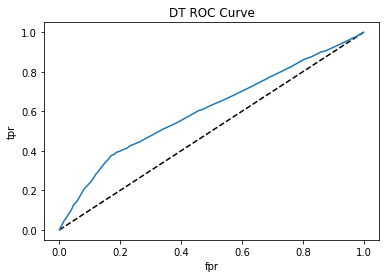

In [10]:
y_pred_proba = DTC.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr, tpr, label='KNN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('DT ROC Curve')
plt.show()

In [11]:
roc_auc_score(y_test, y_pred_proba)

0.6080348918412322

In [12]:
features = X.columns
dot_data = StringIO()
export_graphviz(DTC, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=features, class_names=['Not Converted','Converted'])

In [13]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Conversion_Path.png')
Image(graph.create_png())

## Increase Model Accuracy by Using Entropy and Max-Depth

In [14]:
DTC = DecisionTreeClassifier(criterion='entropy', max_depth=7)
DTC = DTC.fit(X_train, y_train)
print('Train Accuracy Score:', DTC.score(X_train, y_train))
print('Test Accuracy Score:', DTC.score(X_test, y_test))

Train Accuracy Score: 0.8691542288557214
Test Accuracy Score: 0.87


In [15]:
y_pred = DTC.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[17226,     2],
       [ 2572,     0]])

In [16]:
pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
Actual,,,
0,17226,2,17228
1,2572,0,2572
All,19798,2,19800


In [17]:
y_pred_proba = DTC.predict_proba(X_test)[:,1]

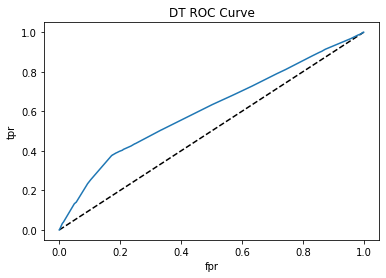

In [18]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr, tpr, label='DT')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('DT ROC Curve')
plt.show()

In [19]:
roc_auc_score(y_test, y_pred_proba)

0.6093392465554825

In [20]:
features = X.columns
dot_data = StringIO()
export_graphviz(DTC, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=features, class_names=['Converted', 'Not Converted'])

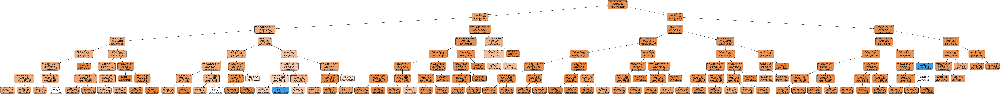

In [21]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Conversion_Path2.png')
Image(graph.create_png())

In [22]:
gc.collect()

41646